In [18]:
# import the libraries
import pandas as pd 
import numpy as np
import string
import spacy
import matplotlib.pyplot as plt
import seaborn as sns 
from wordcloud import WordCloud

In [2]:
df = pd.read_csv('Elon_musk.csv', sep = '\t', header = None,encoding='latin')
df.head()

,0
0,",Text"
1,"1,@kunalb11 Im an alien"
2,"2,@ID_AA_Carmack Ray tracing on Cyberpunk with..."
3,"3,@joerogan @Spotify Great interview!"
4,"4,@gtera27 Doge is underestimated"


In [3]:
df.drop(0, axis=0, inplace=True)
df.head()

,0
1,"1,@kunalb11 Im an alien"
2,"2,@ID_AA_Carmack Ray tracing on Cyberpunk with..."
3,"3,@joerogan @Spotify Great interview!"
4,"4,@gtera27 Doge is underestimated"
5,"5,@teslacn Congratulations Tesla China for ama..."


In [4]:
df.shape

(2081, 1)

In [5]:
df.columns = ['text']

In [6]:
# create a list of sentences from the dataframe
sentences = df['text'].tolist()
sentences[:5]

['1,@kunalb11 I\x92m an alien',
 '2,@ID_AA_Carmack Ray tracing on Cyberpunk with HDR is next-level. Have you tried it?',
 '3,@joerogan @Spotify Great interview!',
 '4,@gtera27 Doge is underestimated',
 '5,@teslacn Congratulations Tesla China for amazing execution last year. Now on to the next for even more!!']

In [7]:
# remove the leading and trailing spaces
sentences = [s.strip() for s in sentences]
sentences[:5]

['1,@kunalb11 I\x92m an alien',
 '2,@ID_AA_Carmack Ray tracing on Cyberpunk with HDR is next-level. Have you tried it?',
 '3,@joerogan @Spotify Great interview!',
 '4,@gtera27 Doge is underestimated',
 '5,@teslacn Congratulations Tesla China for amazing execution last year. Now on to the next for even more!!']

In [8]:
# remove empty strings
sentences = [s for s in sentences if len(s) > 0]

In [9]:
topic = ['Data','Science']
' '.join(topic)

'Data Science'

In [10]:
# join all the sentences into one string
text = ' '.join(sentences)
text

'1,@kunalb11 I\x92m an alien 2,@ID_AA_Carmack Ray tracing on Cyberpunk with HDR is next-level. Have you tried it? 3,@joerogan @Spotify Great interview! 4,@gtera27 Doge is underestimated 5,@teslacn Congratulations Tesla China for amazing execution last year. Now on to the next for even more!! 6,Happy New Year of the Ox! https://t.co/9WFKMYu2oj 7,"Frodo was the underdoge, All thought he would fail, Himself most of all. https://t.co/zGxJFDzzrM" 8,@OwenSparks_ @flcnhvy @anonyx10 Haha thanks :) 9,@flcnhvy @anonyx10 Indeed! Tweets definitely do not represent real-world time allocation. 10,The most entertaining outcome is the most likely 11,@GiveDirectly Just sent some 12,Just agree to do Clubhouse with @kanyewest 13,https://t.co/3rWE9uHSTS 14,@geoffkeighley @UnrealEngine It\x92s getting real 15,"Bought some Dogecoin for lil X, so he can be a toddler hodler" 16,"@JoshManMode He definitely has issues, but the sentencing seems a bit high" 17,@freewalletorg Thanks for fixing 18,@freewalletorg Pl

In [11]:
# remove all punctuations from the text
no_punc_text = text.translate(str.maketrans('', '', string.punctuation))
no_punc_text

'1kunalb11 I\x92m an alien 2IDAACarmack Ray tracing on Cyberpunk with HDR is nextlevel Have you tried it 3joerogan Spotify Great interview 4gtera27 Doge is underestimated 5teslacn Congratulations Tesla China for amazing execution last year Now on to the next for even more 6Happy New Year of the Ox httpstco9WFKMYu2oj 7Frodo was the underdoge All thought he would fail Himself most of all httpstcozGxJFDzzrM 8OwenSparks flcnhvy anonyx10 Haha thanks  9flcnhvy anonyx10 Indeed Tweets definitely do not represent realworld time allocation 10The most entertaining outcome is the most likely 11GiveDirectly Just sent some 12Just agree to do Clubhouse with kanyewest 13httpstco3rWE9uHSTS 14geoffkeighley UnrealEngine It\x92s getting real 15Bought some Dogecoin for lil X so he can be a toddler hodler 16JoshManMode He definitely has issues but the sentencing seems a bit high 17freewalletorg Thanks for fixing 18freewalletorg Please unlock my account 19AstroJordy U0001F923U0001F923 20This is true power ha

# Stemming

In [29]:
from nltk.stem import PorterStemmer
from nltk.tokenize import sent_tokenize,word_tokenize

In [30]:
words=word_tokenize(no_punc_text)
ps=PorterStemmer()
for w in words:
    rootword=ps.stem(w)
    print(rootword)

1kunalb11
im
an
alien
2idaacarmack
ray
trace
on
cyberpunk
with
hdr
is
nextlevel
have
you
tri
it
3joerogan
spotifi
great
interview
4gtera27
doge
is
underestim
5teslacn
congratul
tesla
china
for
amaz
execut
last
year
now
on
to
the
next
for
even
more
6happi
new
year
of
the
ox
httpstco9wfkmyu2oj
7frodo
wa
the
underdog
all
thought
he
would
fail
himself
most
of
all
httpstcozgxjfdzzrm
8owenspark
flcnhvi
anonyx10
haha
thank
9flcnhvi
anonyx10
inde
tweet
definit
do
not
repres
realworld
time
alloc
10the
most
entertain
outcom
is
the
most
like
11givedirectli
just
sent
some
12just
agre
to
do
clubhous
with
kanyewest
13httpstco3rwe9uhst
14geoffkeighley
unrealengin
it
get
real
15bought
some
dogecoin
for
lil
x
so
he
can
be
a
toddler
hodler
16joshmanmod
he
definit
ha
issu
but
the
sentenc
seem
a
bit
high
17freewalletorg
thank
for
fix
18freewalletorg
pleas
unlock
my
account
19astrojordi
u0001f923u0001f923
20thi
is
true
power
haha
httpstcofc9uhqsd7o
21freewalletorg
ani
crypto
wallet
that
wont
give
you
yo

roar
20
again
345erdayastronaut
might
be
a
few
lump
along
the
way
346erdayastronaut
flcnhvi
ercxspac
product
is
hard
prototyp
are
easi
build
1000
starship
to
creat
a
s
httpstcoxjlljpljbp
347icannotenough
aloysiusfeket
rationaletienn
biogirl09
ercxspac
exactli
348rexchapman
haha
349erdayastronaut
flcnhvi
ercxspac
sn9
will
press
ch4
header
tank
with
helium
longterm
solut
is
under
debat
httpstcokawwol54jg
350flabellina212
rationaletienn
biogirl09
ercxspac
ye
351rationaletienn
biogirl09
ercxspac
leg
would
certainli
work
but
best
part
is
no
part
best
step
is
no
step
352flcnhvi
ercxspac
ye
353flcnhvi
ercxspac
save
mass
amp
cost
of
leg
amp
enabl
immedi
reposit
of
booster
on
to
launch
mount

rea
httpstcojwdcjarymj
354ercxspac
wer
go
to
tri
to
catch
the
super
heavi
booster
with
the
launch
tower
arm
use
the
grid
fin
to
take
the
load
355snakehead
dog
had
my
undivid
attent
until
winderhead
ostrich
came
glide
through
all
nonchal
httpstcodtpmdm3tqp
356tesmaniancom
seem
odd
that
the
opposit
group


629westcoastbil
spacex
13
year
amp
11
billion
wow
630owenspark
flcnhvi
tesla
safeti
is
our
primari
design
goal
631ppathol
astrojordi
flcnhvi
fulli
632astronomiaum
let
the
martian
decid
their
own
futur
633shifthappend
tesla
a
lot
of
my
brain
space
is
spent
deal
with
both
unit
634astronomiaum
terraform
will
be
too
slow
to
be
relev
in
our
lifetim
howev
we
can
establish
a
human
base
httpstcouygaae7g3r
635ppathol
xdreamcod
garyblack00
that
is
certainli
the
intent
636xdreamcod
garyblack00
httpstcofrezwjcwna
637garyblack00
the
onli
publicli
trade
stock
i
own
is
tesla
638garyblack00
wise
word
from
bogl
the
point
of
compani
is
product
amp
servic
they
have
no
point
in
amp
of
them
httpstcoencu8cblpi
639teslaownerssv
astrojordi
flcnhvi
no
just
a
mild
cold
same
with
my
bro
def
had
cov2
though
pclt20
mean
viral
httpstcouysanpqtfi
640astronomiaum
life
in
glass
dome
at
first
eventu
terraform
to
support
life
like
earth
641astrojordi
flcnhvi
yeah
642daywalkerxd
astronomiaum
i
wa
go
to
say
sim
but
that

886come
here
no
come
here
u0001f447
887wow
thi
mayo
sure
is
salti
888ppathol
pcgamer
max
payn
wa
great
on
mani
level
silent
hill
good
too
889jack
in
the
box
should
do
doubl
duti
as
a
sperm
donor
clinic

name
is
u0001f44c
890thewpmontgomeri
pcgamer
one
of
the
best
game
ever
891thatdudeshannon
pcgamer
fear
1
with
modern
graphic
amp
sound
would
rock
8921matthewgarcia
pcgamer
ok
893zzcool
pcgamer
all
game
in
thi
thread
are
far
scarier
amp
more
creativ
so
than
ani
horror
movi
894pcgamer
fear
2
is
best
imo
also
dead
space
2
they
will
haunt
your
dream
895rakyl
httpstcop1agokwqpv
896jgrano305
flcnhvi
to
the
best
of
my
knowledg
liter
zero
equip
wa
usabl
without
major
repair
or
upgra
httpstcovrwvop79qd
897flcnhvi
all
that
wa
left
were
broken
bot
amp
equip
hardli
worth
the
scrap
metal
valu
but
we
scroung
up
spa
httpstcoywqqasrbt8
898flcnhvi
and
there
were
actual
zero
employe
in
the
factori
after
gmtoyota
left
they
took
all
good
equip
amp
httpstcoc7dfuastpm
899ajtourvil
bettern
nothin
or
ur
u0001

thi
booster
amp
3rd
flight
for
activ
half
of
fair
aim
for
httpstcoawxtjefc2d
10914th
flight
amp
land
for
thi
booster
httpstcouotvmkgxqh
10925
minut
from
launch
look
good
so
far
httpstcoon2f1py5jt
1093cleantechnica
so
crazi
to
subsid
pollut
thi
is
not
good
for
peopl
especi
in
dens
citi
with
heavi
httpstcoackoizwcpw
1094sciguyspac
it
a
step
in
the
right
direct
but
they
should
realli
aim
for
full
reusabl
by
2026
larger
ro
httpstco6hvvkuqdon
1095turn
volum
to
11
amp
play
powerglid
in
your
tesla
httpstcol07yc02p7g
1096teslaownerssv
fsd
will
solv
these
issu
1097music
volum
on
a
tesla
goe
to
11
becaus
it
louder
than
10
httpstcoab5hamo3en
1098kristennetten
flcnhvi
one
of
my
favorit
writer
foundat
is
tough
to
make
into
a
movi
but
ha
outstand
potenti
1099orionsgauntlet
u0001f4af
1100christianserino
httpstcoglnevuneyl
1101rewatch
young
frankenstein
thi
weekend
still
awesom
ovaltin
httpstcowimdyfsuiq
1102flcnhvi
the
remak
ha
the
potenti
to
be
great
i
kinda
like
the
origin
tbh
but
it
possibl
to


day
moron
1337rt
spacex
onboard
camera
view
of
falcon
9
saocom
1b
launch
and
first
stage
land
land
httpstco2iezyiyyg5
1338mstrofunivers
ppathol
evafoxu
yup
1339evafoxu
13
1340teslarati
rawlinson
didnt
design
model
s
prototyp
wa
done
befor
he
join
amp
he
left
us
in
the
lurch
just
as
t
httpstcooy9yvm84xm
1341erdayastronaut
ppathol
spacex
wer
pretti
close
to
the
manufactur
size
limit
for
a
mill
copper
amp
steel
ja
httpstcot8d3yn4xri
1342a
la
guerr
comm
à
la
guerr
1343harsimranbans
haha
1344bnordhaug
and
start
tweet
1345if
you
bombard
earth
with
enough
photon
eventu
it
emit
a
tesla
ak
1346idaacarmack
there
is
alreadi
bidirect
commun
between
human
amp
ai
via
phone
amp
comput
it
just
lo
httpstcot42iuazmwh
1347erdayastronaut
ppathol
spacex
abov
50
like
to
make
it
1348ppathol
spacex
thi
is
a
test
engin
flight
articl
are
fix
with
no
gimbal
1349spacex
worth
note
that
thrust
is
onli
slightli
higher
with
the
big
bell
nozzl
version
larger
bell
is
primarili
httpstcokiegovt0rd
1350rt
spacex
the
f

day
soon
i
will
wear
thi
outfit
httpstcot0snf4ugyk
1615markgoldberg
tesla
i
wa
tri
to
channel
herb
tarlek
from
wkrp
httpstco0rc72s0zay
1616markgoldberg
tesla
note
the
fabul
plaid
jacket
amp
gingham
shirt
combo
u0001f923
1617archillect
twin
peak
1618samtalkstesla
work
on
my
mom
cousin
farm
in
saskatchewan
at
age
17
i
think
we
did
a
barnrais
that
day
1619wonderofsci
httpstcoy7lrlouxr9
1620erdayastronaut
not
sure
yet
but
hope
will
need
leg
amp
other
repair
probabl
sn6
fli
befor
sn5
we
need
httpstcocgxsnck6uv
1621lexfridman
clearli
1622rt
erdayastronaut
spot
the
tini
human
thi
shot
realli
put
it
into
scale
a
full
blown
starship
and
superheavi
will
be
hard
to
fat
1623ramacvr
kristennetten
ppathol
berniesand
also
true
1624kristennetten
ppathol
berniesand
u0001f923u0001f923
1625ppathol
berniesand
over
time
sinc
we
give
all
employe
share
my
ownership
is
dilut
automat
from
httpstcoaqgi0cu2hn
1626rt
theplanetaryguy
video
like
thi
will
alway
amaz
me
astronom
jan
koet
captur
thi
video
in
2007
of

doe
that
in
alpha
build
1882cleantechnica
lithium
is
extrem
common
on
earth
found
almost
everywher
1883nishy03
hiromichimizuno
congratul
mhi
amp
uae
1884bar2t
joebangles11
teslarati
stilton
1885kristennetten
businessinsid
new
deep
crimson
from
giga
berlin
is
my
favorit
1886teslarati
import
to
servic
veri
high
latitud
1887confiantman
american
but
born
in
south
africa
left
by
myself
when
i
wa
17
1888businessinsid
true
the
2012
model
s
is
still
a
great
car
wa
drive
sn28
a
few
month
ago
and
drive
feel
wa
httpstcomrutle8y2v
1889rt
businessinsid
tesla
model
3
receiv
top
mark
from
safeti
organ
in
north
america
europ
and
australia
httpstconb92
1890teslaownerssv
stephenpallotta
will
discuss
on
wed
earn
call
lot
to
talk
about
1891stephenpallotta
u0001f923u0001f923
1892ahoward8
ye
1893hiromichimizuno
thi
look
cool
1894ppathol
it
ha
that
potenti
1895maxxrpbtc
thecryptolark
manny6manni
jungleincxrp
digitalassetbuy
moonlamboio
jwilliamsfstm
good
articl
i
httpstcoanite06dlj
1896teslaownerssv
waitbutw

# Lemmatization

In [27]:
import nltk
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\bhale\AppData\Roaming\nltk_data...


True

In [40]:
nltk.download('omw-1.4')

[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\bhale\AppData\Roaming\nltk_data...


True

In [37]:
from nltk.stem import WordNetLemmatizer

In [38]:
lemmatizer=WordNetLemmatizer()

In [41]:
print(lemmatizer.lemmatize('dances'))

dance


In [42]:
print(lemmatizer.lemmatize(no_punc_text))

1kunalb11 Im an alien 2IDAACarmack Ray tracing on Cyberpunk with HDR is nextlevel Have you tried it 3joerogan Spotify Great interview 4gtera27 Doge is underestimated 5teslacn Congratulations Tesla China for amazing execution last year Now on to the next for even more 6Happy New Year of the Ox httpstco9WFKMYu2oj 7Frodo was the underdoge All thought he would fail Himself most of all httpstcozGxJFDzzrM 8OwenSparks flcnhvy anonyx10 Haha thanks  9flcnhvy anonyx10 Indeed Tweets definitely do not represent realworld time allocation 10The most entertaining outcome is the most likely 11GiveDirectly Just sent some 12Just agree to do Clubhouse with kanyewest 13httpstco3rWE9uHSTS 14geoffkeighley UnrealEngine Its getting real 15Bought some Dogecoin for lil X so he can be a toddler hodler 16JoshManMode He definitely has issues but the sentencing seems a bit high 17freewalletorg Thanks for fixing 18freewalletorg Please unlock my account 19AstroJordy U0001F923U0001F923 20This is true power haha http

In [43]:
# word tokenization using spacy
nlp = spacy.load('en_core_web_md')
doc = nlp(no_punc_text)
tokens = [token.text for token in doc]
tokens[:10]

['1kunalb11',
 'I\x92m',
 'an',
 'alien',
 '2IDAACarmack',
 'Ray',
 'tracing',
 'on',
 'Cyberpunk',
 'with']

# Stop Words

In [44]:
# create stopwords list
stopwords = spacy.lang.en.stop_words.STOP_WORDS
stopwords

{"'d",
 "'ll",
 "'m",
 "'re",
 "'s",
 "'ve",
 'a',
 'about',
 'above',
 'across',
 'after',
 'afterwards',
 'again',
 'against',
 'all',
 'almost',
 'alone',
 'along',
 'already',
 'also',
 'although',
 'always',
 'am',
 'among',
 'amongst',
 'amount',
 'an',
 'and',
 'another',
 'any',
 'anyhow',
 'anyone',
 'anything',
 'anyway',
 'anywhere',
 'are',
 'around',
 'as',
 'at',
 'back',
 'be',
 'became',
 'because',
 'become',
 'becomes',
 'becoming',
 'been',
 'before',
 'beforehand',
 'behind',
 'being',
 'below',
 'beside',
 'besides',
 'between',
 'beyond',
 'both',
 'bottom',
 'but',
 'by',
 'ca',
 'call',
 'can',
 'cannot',
 'could',
 'did',
 'do',
 'does',
 'doing',
 'done',
 'down',
 'due',
 'during',
 'each',
 'eight',
 'either',
 'eleven',
 'else',
 'elsewhere',
 'empty',
 'enough',
 'even',
 'ever',
 'every',
 'everyone',
 'everything',
 'everywhere',
 'except',
 'few',
 'fifteen',
 'fifty',
 'first',
 'five',
 'for',
 'former',
 'formerly',
 'forty',
 'four',
 'from',
 'fron

In [45]:
# remove stopwords from the tokens
tokens = [token for token in tokens if token not in stopwords]
tokens[:10]

['1kunalb11',
 'I\x92m',
 'alien',
 '2IDAACarmack',
 'Ray',
 'tracing',
 'Cyberpunk',
 'HDR',
 'nextlevel',
 'Have']

In [46]:
# convert all tokens to lowercase
tokens = [token.lower() for token in tokens]
tokens[:10]

['1kunalb11',
 'i\x92m',
 'alien',
 '2idaacarmack',
 'ray',
 'tracing',
 'cyberpunk',
 'hdr',
 'nextlevel',
 'have']

In [47]:
# reducing the tokens to their root form
lemmas = [token.lemma_ for token in doc]
lemmas[:10]

['1kunalb11',
 'I\x92m',
 'an',
 'alien',
 '2idaacarmack',
 'Ray',
 'trace',
 'on',
 'cyberpunk',
 'with']

In [48]:
# feature extraction
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer()
X = cv.fit_transform(lemmas)

In [49]:
cv.vocabulary_

{'1kunalb11': 1138,
 'an': 2241,
 'alien': 2208,
 '2idaacarmack': 1283,
 'ray': 5291,
 'trace': 6079,
 'on': 4944,
 'cyberpunk': 2864,
 'with': 6454,
 'hdr': 3518,
 'be': 2422,
 'nextlevel': 4867,
 'have': 3512,
 'you': 6501,
 'try': 6113,
 'it': 4375,
 '3joerogan': 1411,
 'spotify': 5737,
 'great': 3460,
 'interview': 4353,
 '4gtera27': 1537,
 'doge': 3000,
 'underestimate': 6239,
 '5teslacn': 1651,
 'congratulations': 2764,
 'tesla': 5938,
 'china': 2664,
 'for': 3318,
 'amazing': 2232,
 'execution': 3192,
 'last': 4492,
 'year': 6494,
 'now': 4902,
 'to': 6040,
 'the': 5974,
 'next': 4866,
 'even': 3164,
 'more': 4789,
 '6happy': 1767,
 'new': 4864,
 'of': 4935,
 'ox': 5006,
 'httpstco9wfkmyu2oj': 3696,
 '7frodo': 1883,
 'underdoge': 6238,
 'all': 2210,
 'think': 5998,
 'he': 3519,
 'would': 6473,
 'fail': 3228,
 'himself': 3562,
 'most': 4794,
 'httpstcozgxjfdzzrm': 4209,
 '8owenspark': 1995,
 'flcnhvy': 3298,
 'anonyx10': 2258,
 'haha': 3489,
 'thank': 5970,
 '9flcnhvy': 2112,
 'i

In [50]:
# create a dataframe from the vaocabulary
pd.DataFrame(cv.vocabulary_, index=[0]).T.sort_values(by=0, ascending=False)

,0
ðogecoin,6517
zone,6516
zon,6515
zogfotpik,6514
zip2,6513
...,...
10000,4
1000,3
100,2
10,1


In [51]:
X.shape

(21593, 6518)

In [52]:
# include bigrams and trigrams in addition to unigrams & limit features to 100
cv_ngram = CountVectorizer(ngram_range=(1,3), max_features=100)
bow_matrix_ngram = cv_ngram.fit_transform(lemmas)

In [53]:
# display the bow matrix as an array
bow_matrix_ngram.toarray()

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

In [54]:
# get the features 
cv_ngram.get_feature_names_out()

array(['about', 'all', 'also', 'amp', 'an', 'and', 'as', 'at', 'be',
       'but', 'by', 'can', 'car', 'come', 'day', 'do', 'dragon', 'engine',
       'erdayastronaut', 'falcon', 'first', 'flcnhvy', 'flight', 'for',
       'from', 'get', 'go', 'good', 'great', 'haha', 'have', 'he', 'high',
       'if', 'in', 'it', 'just', 'launch', 'like', 'lot', 'make', 'maybe',
       'more', 'most', 'much', 'my', 'nasa', 'nasaspaceflight', 'need',
       'new', 'next', 'no', 'not', 'now', 'of', 'on', 'one', 'or', 'our',
       'out', 'people', 'ppathole', 'probably', 'production', 're',
       'should', 'so', 'some', 'spacestation', 'spacex', 'starship',
       'sure', 'tesla', 'test', 'than', 'that', 'the', 'there', 'they',
       'this', 'time', 'to', 'too', 'true', 'u0001f923u0001f923', 'use',
       'very', 'we', 'well', 'what', 'wholemarsblog', 'will', 'with',
       'work', 'would', 'yeah', 'year', 'yes', 'you', 'your'],
      dtype=object)

In [55]:
# TF- IDF Vectorizer with upto trigrams and max 10 features
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf = TfidfVectorizer(norm = 'l2',ngram_range=(1,3), max_features=10)
tfidf_matrix = tfidf.fit_transform(lemmas)

In [56]:
tfidf.get_feature_names_out()

array(['amp', 'be', 'for', 'in', 'it', 'of', 'spacex', 'the', 'to', 'we'],
      dtype=object)

In [57]:
tfidf_matrix.toarray()

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [58]:
# convert the tfidf matrix to a dataframe
pd.DataFrame(tfidf_matrix.toarray(), columns=tfidf.get_feature_names_out())

,amp,be,for,in,it,of,spacex,the,to,we
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
21588,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
21589,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
21590,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
21591,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


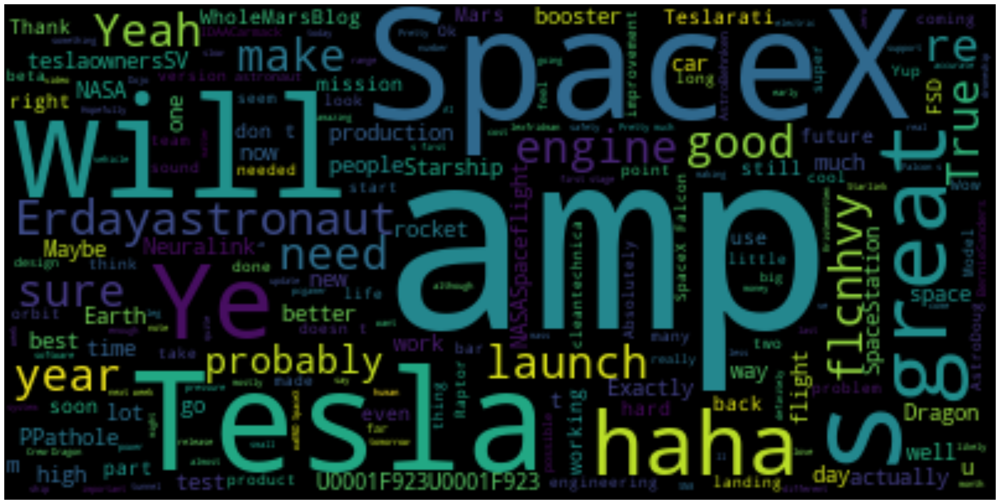

In [59]:
# generate wordcloud
plt.figure(figsize=(30,30),dpi=300)
wordcloud = WordCloud().generate(no_punc_text)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show();

# Emotion Mining

In [60]:
df = pd.read_csv('Elon_musk.csv', sep = '\t', header = None,encoding='latin')
df.head()

,0
0,",Text"
1,"1,@kunalb11 Im an alien"
2,"2,@ID_AA_Carmack Ray tracing on Cyberpunk with..."
3,"3,@joerogan @Spotify Great interview!"
4,"4,@gtera27 Doge is underestimated"


In [61]:
df.drop(0, axis = 0, inplace = True)
df.head()

,0
1,"1,@kunalb11 Im an alien"
2,"2,@ID_AA_Carmack Ray tracing on Cyberpunk with..."
3,"3,@joerogan @Spotify Great interview!"
4,"4,@gtera27 Doge is underestimated"
5,"5,@teslacn Congratulations Tesla China for ama..."


In [62]:
# remove the leading and trailing spaces from the text in the dataframe and create a list
review = df[0].str.strip().tolist()
review = [i for i in review if i] # remove empty strings
review[:10]

['1,@kunalb11 I\x92m an alien',
 '2,@ID_AA_Carmack Ray tracing on Cyberpunk with HDR is next-level. Have you tried it?',
 '3,@joerogan @Spotify Great interview!',
 '4,@gtera27 Doge is underestimated',
 '5,@teslacn Congratulations Tesla China for amazing execution last year. Now on to the next for even more!!',
 '6,Happy New Year of the Ox! https://t.co/9WFKMYu2oj',
 '7,"Frodo was the underdoge,',
 'All thought he would fail,',
 'Himself most of all. https://t.co/zGxJFDzzrM"',
 '8,@OwenSparks_ @flcnhvy @anonyx10 Haha thanks :)']

In [63]:
# use re library & clean up the text to remove punctuations, numbers, text in square brackets, links, special characters and also convert to lowercase
import re
def clean_text(text):
    text = re.sub(r'@[A-Za-z0-9]+', '', text) # remove @mentions
    text = re.sub(r'#', '', text) # remove the # symbol
    text = re.sub(r'RT[\s]+', '', text) # remove RT
    text = re.sub(r'https?:\/\/\S+', '', text) # remove the hyperlink
    text = re.sub(r'[^a-zA-Z.!?]', ' ', text) # remove all characters except a-z, A-Z, ., !, ?
    text = re.sub(r'\s+', ' ', text) # remove extra whitespace
    # convert to lowercase
    text = text.lower()
    return text

In [64]:
df=df.rename({0:'review'},axis=1)

In [65]:
df.head()

,review
1,"1,@kunalb11 Im an alien"
2,"2,@ID_AA_Carmack Ray tracing on Cyberpunk with..."
3,"3,@joerogan @Spotify Great interview!"
4,"4,@gtera27 Doge is underestimated"
5,"5,@teslacn Congratulations Tesla China for ama..."


In [66]:
# apply the clean_text function to the text column
df['review'] = df['review'].apply(clean_text)
df.head()

,review
1,i m an alien
2,aa carmack ray tracing on cyberpunk with hdr ...
3,great interview!
4,doge is underestimated
5,congratulations tesla china for amazing execu...


In [67]:
# remove the leading and trailing spaces from the text in the dataframe and create a list
reviews = df['review'].str.strip().tolist()
reviews = [i for i in reviews if i] # remove empty strings
reviews[:10]

['i m an alien',
 'aa carmack ray tracing on cyberpunk with hdr is next level. have you tried it?',
 'great interview!',
 'doge is underestimated',
 'congratulations tesla china for amazing execution last year. now on to the next for even more!!',
 'happy new year of the ox!',
 'frodo was the underdoge',
 'all thought he would fail',
 'himself most of all.',
 'haha thanks']

In [68]:
len(reviews)

1999

# Named Entity Recognition

In [69]:
from spacy import displacy

In [70]:
# load spacy model
nlp = spacy.load('en_core_web_md')

In [71]:
# take one element of the list and pass it to the nlp model to get the spacy doc object
doc = nlp(reviews[4])

In [72]:
# render spacy document with named entities highlighted
displacy.render(doc,style='ent',jupyter=True)

In [73]:
# pos tagging of all the tokens in the document
for token in doc:
    print(token.text, token.pos_)

congratulations VERB
tesla PRON
china PROPN
for ADP
amazing ADJ
execution NOUN
last ADJ
year NOUN
. PUNCT
now ADV
on ADP
to ADP
the DET
next ADJ
for ADP
even ADV
more ADJ
! PUNCT
! PUNCT


In [74]:
# filter & extract only tokens which are nouns & verbs and create a list
nouns_verbs = [token.text for token in doc if token.pos_ in ['NOUN', 'VERB']] # list comprehension
nouns_verbs[:10]

['congratulations', 'execution', 'year']

In [75]:
# create a dataframe from the vaocabulary
nouns_verbs_df=pd.DataFrame(cv.vocabulary_, index=[0]).T.sort_values(by=0, ascending=False)

In [76]:
nouns_verbs_df

,0
ðogecoin,6517
zone,6516
zon,6515
zogfotpik,6514
zip2,6513
...,...
10000,4
1000,3
100,2
10,1


Text(0.5, 1.0, 'Top 5 nouns & verbs')

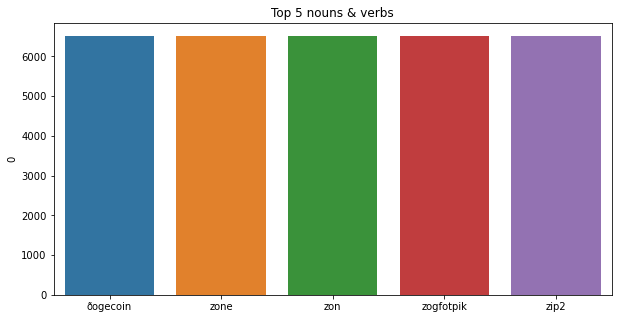

In [77]:
# bar charts of the top 5 nouns_verbs
plt.figure(figsize=(10,5))
sns.barplot(data=nouns_verbs_df.head(5), x=nouns_verbs_df.head(5).index, y=0)
plt.title('Top 5 nouns & verbs')

In [78]:
# load the Afinn.csv dataset which contains the list of words and their sentiment scores
afinn = pd.read_csv('Afinn.csv',encoding='latin')
afinn.head()

,word,value
0,abandon,-2
1,abandoned,-2
2,abandons,-2
3,abducted,-2
4,abduction,-2


In [79]:
# create a spacy doc fron the reviews list
doc=nlp(' '.join(reviews))

In [80]:
doc

i m an alien aa carmack ray tracing on cyberpunk with hdr is next level. have you tried it? great interview! doge is underestimated congratulations tesla china for amazing execution last year. now on to the next for even more!! happy new year of the ox! frodo was the underdoge all thought he would fail himself most of all. haha thanks indeed! tweets definitely do not represent real world time allocation. the most entertaining outcome is the most likely just sent some just agree to do clubhouse with it s getting real bought some dogecoin for lil x so he can be a toddler hodler he definitely has issues but the sentencing seems a bit high thanks for fixing please unlock my account u f u f this is true power haha any crypto wallet that won t give you your private keys should be avoided at all costs your app sucks nasa has selected falcon heavy to launch the first two elements of the lunar gateway together on one mission! yes once we can predict cash flow reasonably well starlink will ipo s

In [81]:
# a sample output of the sentence tokenization
for review in doc.sents:
    print(review)

i m an alien aa carmack ray tracing on cyberpunk with hdr is next level.
have you tried it?
great interview!
doge is underestimated congratulations tesla china for amazing execution last year.
now on to the next for even more!!
happy new year of the ox! frodo was the underdoge
all thought he would fail himself most of all.
haha thanks indeed!
tweets definitely do not represent real world time allocation.
the most entertaining outcome is the most likely just sent some just agree to do clubhouse with it s getting real bought some dogecoin for lil x
so he can be a toddler hodler he definitely has issues but the sentencing seems a bit high thanks for fixing please unlock my account
u f u f this is true power haha any crypto wallet that won t give you your private keys should be avoided at all costs your app sucks nasa has selected falcon heavy to launch the first two elements of the lunar gateway together on one mission!
yes once we can predict cash flow reasonably well starlink will ipo s

works well with flamethrowers!
my favorite is one in tension other dof in compression.
new roadster w
yes aloha welcome back from space
u f ab yeah will post shortly mitka winning worst person i ve ever worked with is not easy.
some real champions are vying for that title!
fairing chute control amp ship control are closing the loop locally.
both operating on spacex autopilot.
ms tree catches fairing in her net u f falcon s first stage has landed on the of course i still love you droneship first time a booster has completed six flights!
up there somewhere cruising through deep space must be aliens
yes this little spit of dirt will take us to mars humans are swiftly becoming a small percentage of total compute max demonstrated raptor thrust is tons amp min is tons
so they re actually u f a
that s engine sn.
we re building sn of the ship.
sn is about to be tested amp has several upgrades over bar engine.
for reference bar on r raptor engine just reached bar chamber pressure without explod

In [82]:
# create list of sentence tokens from the spacy document 
review = [review for review in doc.sents]
review

[i m an alien aa carmack ray tracing on cyberpunk with hdr is next level.,
 have you tried it?,
 great interview!,
 doge is underestimated congratulations tesla china for amazing execution last year.,
 now on to the next for even more!!,
 happy new year of the ox! frodo was the underdoge,
 all thought he would fail himself most of all.,
 haha thanks indeed!,
 tweets definitely do not represent real world time allocation.,
 the most entertaining outcome is the most likely just sent some just agree to do clubhouse with it s getting real bought some dogecoin for lil x,
 so he can be a toddler hodler he definitely has issues but the sentencing seems a bit high thanks for fixing please unlock my account,
 u f u f this is true power haha any crypto wallet that won t give you your private keys should be avoided at all costs your app sucks nasa has selected falcon heavy to launch the first two elements of the lunar gateway together on one mission!,
 yes once we can predict cash flow reasonably

In [83]:
# set a word column of the afinn dataframe as the index and create a dictionary
afinn_scores=afinn.set_index('word')['value'].to_dict()
afinn_scores

{'abandon': -2,
 'abandoned': -2,
 'abandons': -2,
 'abducted': -2,
 'abduction': -2,
 'abductions': -2,
 'abhor': -3,
 'abhorred': -3,
 'abhorrent': -3,
 'abhors': -3,
 'abilities': 2,
 'ability': 2,
 'aboard': 1,
 'absentee': -1,
 'absentees': -1,
 'absolve': 2,
 'absolved': 2,
 'absolves': 2,
 'absolving': 2,
 'absorbed': 1,
 'abuse': -3,
 'abused': -3,
 'abuses': -3,
 'abusive': -3,
 'accept': 1,
 'accepted': 1,
 'accepting': 1,
 'accepts': 1,
 'accident': -2,
 'accidental': -2,
 'accidentally': -2,
 'accidents': -2,
 'accomplish': 2,
 'accomplished': 2,
 'accomplishes': 2,
 'accusation': -2,
 'accusations': -2,
 'accuse': -2,
 'accused': -2,
 'accuses': -2,
 'accusing': -2,
 'ache': -2,
 'achievable': 1,
 'aching': -2,
 'acquit': 2,
 'acquits': 2,
 'acquitted': 2,
 'acquitting': 2,
 'acrimonious': -3,
 'active': 1,
 'adequate': 1,
 'admire': 3,
 'admired': 3,
 'admires': 3,
 'admiring': 3,
 'admit': -1,
 'admits': -1,
 'admitted': -1,
 'admonish': -2,
 'admonished': -2,
 'adopt': 

In [84]:
# using the above dictionary, create a function to calculate the sentiment score of each sentence
# the sentiment score of a sentence is the sum of the sentiment scores of all the words in the sentence
def sentiment_score(review):
    score  = 0
    sent_doc = nlp(review)
    for token in sent_doc:
        if token.text in afinn_scores:
            score += afinn_scores[token.text]
    return score

In [85]:
# calculate the sentiment score for each sentence in the sentences list using the above function
sentiment_scores = [sentiment_score(review.text) for review in review]
sentiment_scores[:10] # sample output

[0, 0, 3, 5, 0, 3, -2, 5, 0, 3]

In [86]:
# create a dataframe with the sentences and their sentiment scores
sentiment_df = pd.DataFrame({'Reviews':review, 'Sentiment_Score':sentiment_scores})
sentiment_df.head()

,Reviews,Sentiment_Score
0,"(i, m, an, alien, aa, carmack, ray, tracing, o...",0
1,"(have, you, tried, it, ?)",0
2,"(great, interview, !)",3
3,"(doge, is, underestimated, congratulations, te...",5
4,"(now, on, to, the, next, for, even, more, !, !)",0


In [87]:
sentiment_df.iloc[0,0]

i m an alien aa carmack ray tracing on cyberpunk with hdr is next level.

In [88]:
# sort the dataframe by the sentiment score in descending order
sentiment_df.sort_values('Sentiment_Score', ascending=False).head(10)

,Reviews,Sentiment_Score
49,"(ur, welcome, the, most, entertaining, outcome...",18
933,"(wow, buddies, my, button, twiddling, makes, n...",16
713,"(starship, sn, with, rear, body, flaps, sure, ...",12
756,"(the, open, areas, shaped, like, a, diamond, a...",12
246,"(and, umm, i, absolutely, support, trans, but,...",12
201,"(but, definitely, this, year, good, point, stv...",11
108,"(it, will, be, awesome, good, point, your, ser...",10
769,"(good, analysis, exactly, gary, the, snail, is...",10
832,"(wow, i, super, loved, astronomy)",10
694,"(for, the, launch, of, the, and, crew, mission...",10


In [89]:
# sort the dataframe by the sentiment score in descending order
sentiment_df.sort_values('Sentiment_Score', ascending=True).head(10)

,Reviews,Sentiment_Score
836,"(very, ba, it, s, too, embarrassing, just, lea...",-8
1026,"(deus, ex, ., skeptic, neuralinks, are, curren...",-8
87,"(also, the, road, to, hell, is, mostly, paved,...",-7
290,"(spacex, neuralink, amp, boring, co, much, of,...",-6
766,"(a, there, are, some, eerie, parallels, betwee...",-5
620,"(he, plays, the, poor, inventor, card, but, wa...",-5
1079,"(cool, model, review, by, tesla, will, add, a,...",-5
574,"(we, also, have, to, consider, population, lif...",-5
322,"(fate, loves, irony, but, hates, hypocrisy, bo...",-4
879,"(occasional, flights, from, land, are, ok, but...",-4


In [90]:
#summary of sentiment scores
sentiment_df['Sentiment_Score'].describe().round(2)

count    1190.00
mean        1.23
std         2.49
min        -8.00
25%         0.00
50%         0.00
75%         2.75
max        18.00
Name: Sentiment_Score, dtype: float64

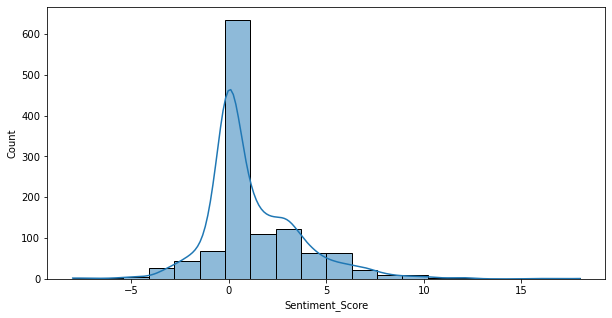

In [91]:
# distribution of sentiment scores
plt.figure(figsize=(10,5))
sns.histplot(data=sentiment_df, x='Sentiment_Score', bins=20, kde=True);

# N-Gram analysis

## Bi- Gram analysis

In [92]:
# write a user defined function to return the top 200 bigrams with their frequencies as a dataframe
def get_top_n2_bigrams(corpus, n=None):
    vec = CountVectorizer(ngram_range=(2, 2), max_features=200).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return pd.DataFrame(words_freq[:n])

In [93]:
top_2grams_df = get_top_n2_bigrams(df['review'], 200)
top_2grams_df.head()

,0,1
0,will be,51
1,of the,47
2,this is,36
3,in the,36
4,aa carmack,31


In [94]:
top_2grams_df.columns = ['bigram', 'count']
top_2grams_df.head()

,bigram,count
0,will be,51
1,of the,47
2,this is,36
3,in the,36
4,aa carmack,31


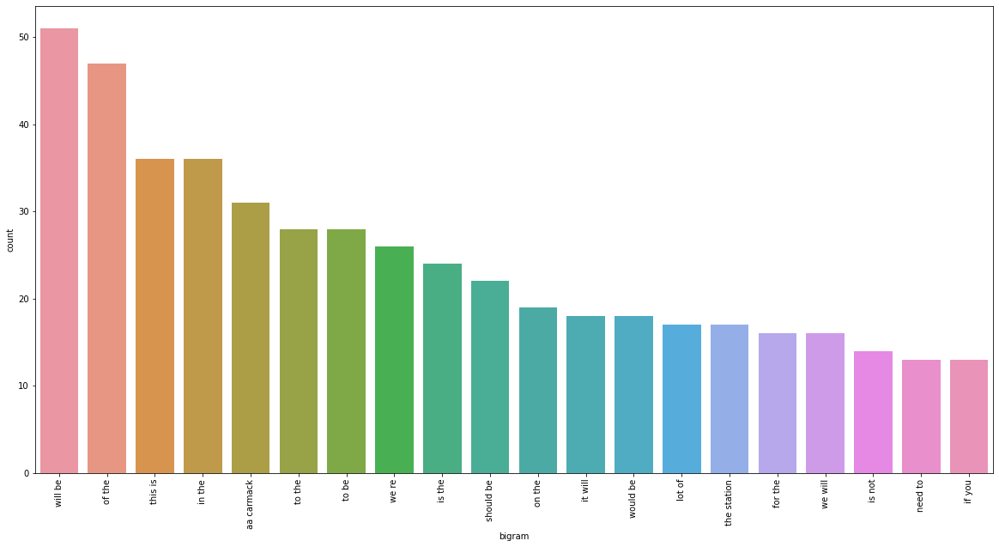

In [95]:
# bar plot of top 20 bigrams
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(20,10))
sns.barplot(x='bigram', y='count', data=top_2grams_df[:20])
plt.xticks(rotation=90);

## tri-gram

In [96]:
# user defined function to return the top specified trigrams with their frequencies as a dataframe
def get_top_n3_trigrams(corpus, n=None):
    vec = CountVectorizer(ngram_range=(3, 3), max_features=200).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return pd.DataFrame(words_freq[:n])

In [97]:
top_3grams_df = get_top_n3_trigrams(df['review'], 200)
top_3grams_df.head()

,0,1
0,falcon first stage,9
1,to the station,9
2,it will be,8
3,of course still,7
4,course still love,7


In [98]:
# rename the columns
top_3grams_df.columns = ['trigram', 'count']
top_3grams_df.head()

,trigram,count
0,falcon first stage,9
1,to the station,9
2,it will be,8
3,of course still,7
4,course still love,7


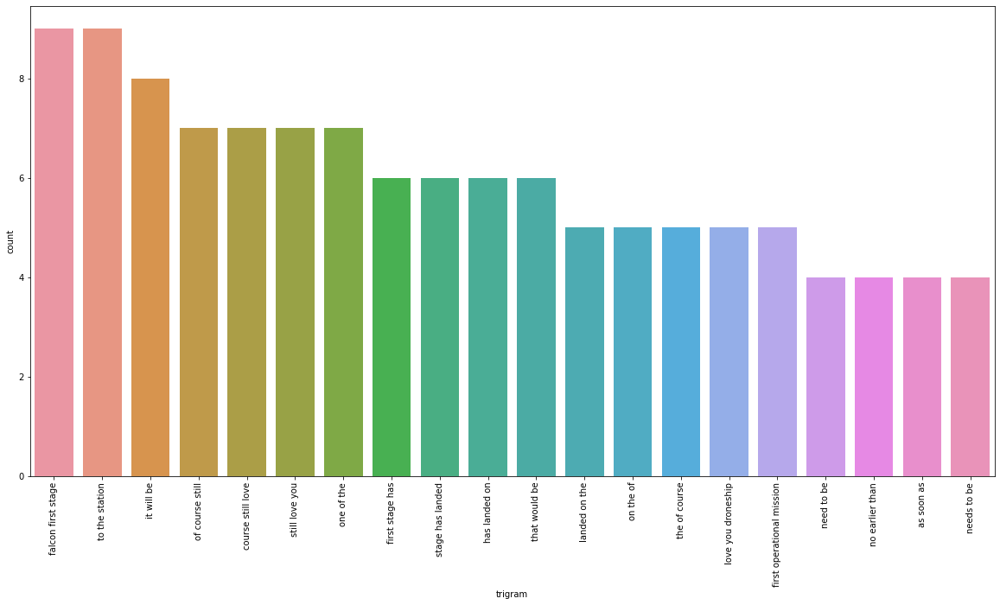

In [99]:
# barplot of top 20 trigrams
plt.figure(figsize=(20,10))
sns.barplot(x='trigram', y='count', data=top_3grams_df[:20])
plt.xticks(rotation=90);

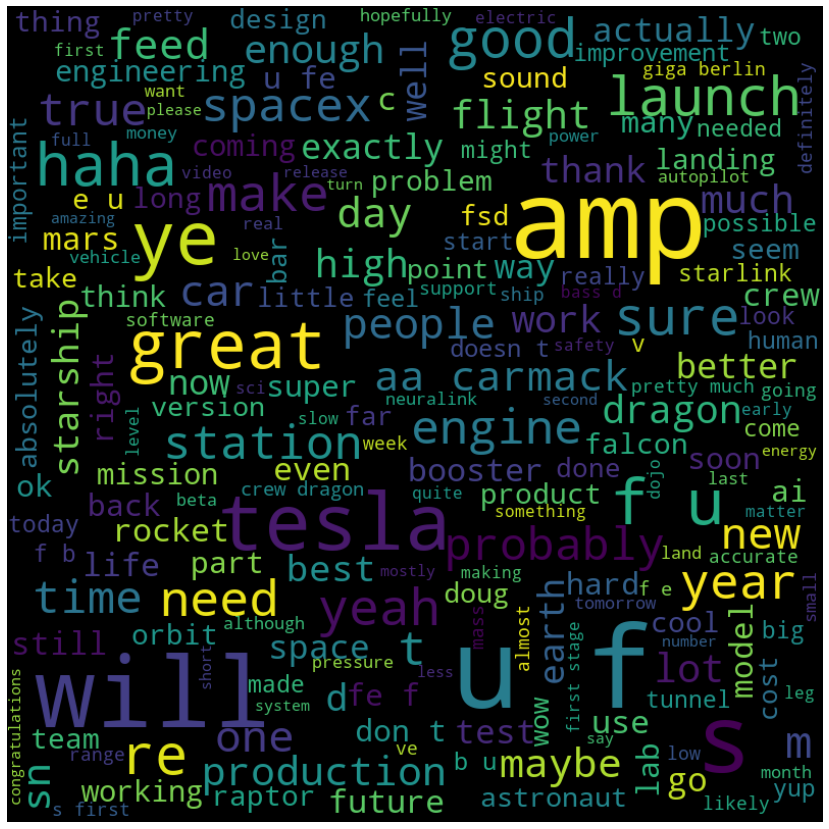

In [100]:
# create a wordcloud of the words in the text column
from wordcloud import WordCloud
wordcloud = WordCloud(width=800, height=800, random_state=21, max_font_size=110).generate(' '.join(df['review']))
plt.figure(figsize=(15, 15))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off');